# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 5

**Author 1 (sciper):** Camillo Nicolò De Sabbata (335004)  
**Author 2 (sciper):** Gianluca Radi (334736)   
**Author 3 (sciper):** Alessandro Dalbesio (352298)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [56]:
import tarfile
import os

data_base_path = './'
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

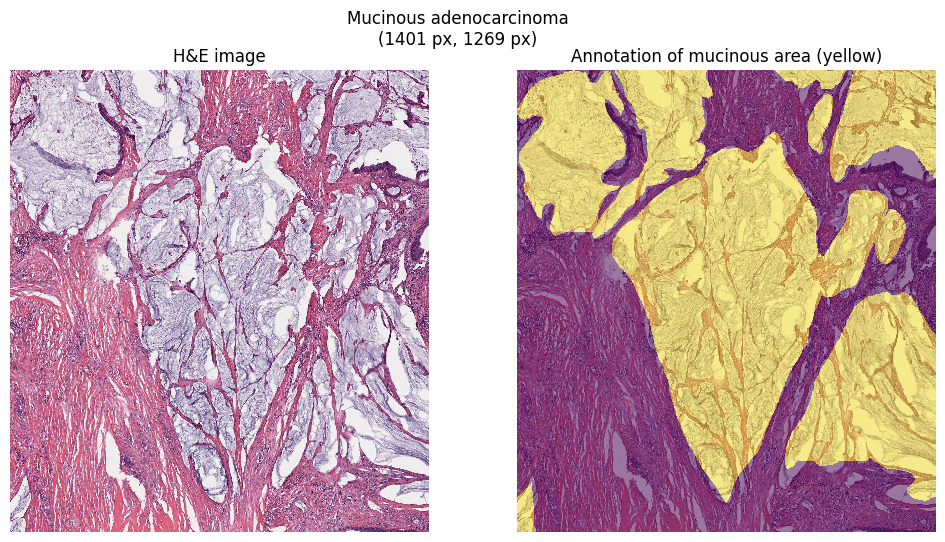

In [57]:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

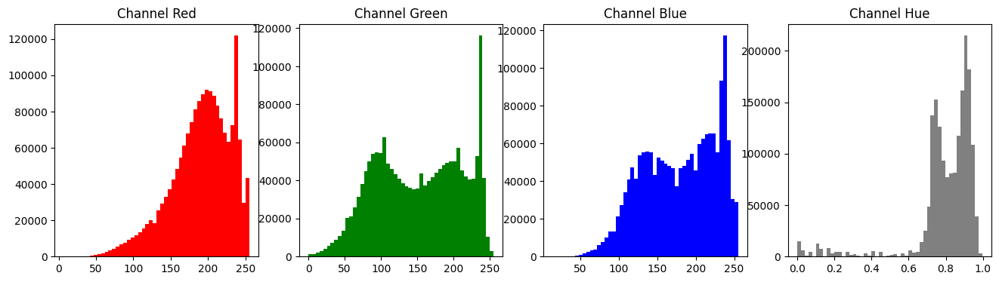

In [58]:
# Display the histograms of the image
fig, ax = plt.subplots(1, 4, figsize=(16, 4))

# Red, Green and blue channels
channel_name = ['Red', 'Green', 'Blue']
for i in range(3):
    ax[i].hist(adeno_img[:, :, i].flatten(), bins=50, color=channel_name[i].lower())
    ax[i].set_title(f'Channel {channel_name[i]}')

# Hue channel
hsv_image = skimage.color.rgb2hsv(adeno_img) # Convert the image to HSV
ax[3].hist(hsv_image[:, :, 0].flatten(), bins=50, color='grey')
ax[3].set_title('Channel Hue')

# Show the plots
plt.suptitle('')
plt.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

In [59]:
# Definition of the error_rate function
def error_rate(mask, gt):
    """Compute error rate between ground truth and prediction.
    
    Args:
        mask: predicted mask
        gt: ground truth mask

    Returns:
        error rate
    """
    return (mask != gt).mean()

In [60]:
from skimage import filters
from tabulate import tabulate
from colorama import Back, Fore, Style

# Compute threshold for each channel
channel_name = ['Red', 'Green', 'Blue', 'Hue'] # List of the channels we will test
threshold_names = ["Isodata", "Li", "Minimum", "Mean", "Triangle", "Yen", "Otsu"] # List of the methods we will test
best_thresholding_method_index = np.zeros(len(channel_name))   # Index of the best threshold method for each channel
best_thresholds = np.zeros(len(channel_name)) # Value of the best threshold for each channel
thresholds = np.zeros((len(channel_name), len(threshold_names))) # Threshold value for each channel and each method
for i in range(3):
    for j, threshold_name in enumerate(threshold_names):
        thresholds[i, j] = getattr(filters, "threshold_" + threshold_name.lower())(adeno_img[:, :, i])
for j, threshold_name in enumerate(threshold_names):
    thresholds[3, j] = getattr(filters,"threshold_" + threshold_name.lower())(hsv_image[:, :, 0])


# Display the table with the value of the threshold for each channel and method
tableElem = []
for i in range(len(channel_name)):
    temp = [channel_name[i]]
    for j in range(len(threshold_names)):
        temp.append(np.around(thresholds[i, j], 2))
    tableElem.append(temp)
print("Threshold values for each channel and method:")
print(tabulate(tableElem, ['']+threshold_names, tablefmt="pretty"))


# Compute error for each channel and method 
tableElem = []
for i in range(len(channel_name)):
    # Compute error for each threshold method for each channel
    tableElem.append([channel_name[i]])
    threshold_errors = np.zeros(len(threshold_names))
    for j in range(len(threshold_names)):
        threshold = thresholds[i, j]
        threshold_name = threshold_names[j]
        if i < 3:
            prediction = adeno_img[:, :, i] > threshold
        else:
            prediction = hsv_image[:, :, 0] < threshold
        # Compute error as the percentage of pixels that are not correctly classified
        error = error_rate(prediction, adeno_gt)
        threshold_errors[j] = error
        tableElem[i].append(np.around(error, 4))

    # Find the best threshold method and get its value
    best_thresholding_method_index[i] = np.argmin(threshold_errors)
    best_thresholds[i] = thresholds[i, int(best_thresholding_method_index[i])]


# Display the table with the error for each channel and method
print("\nErrors for each channel and threshold method:")
for i in range(len(tableElem)):
    for j in range(len(tableElem[i])):
        if j == best_thresholding_method_index[i]+1:
            tableElem[i][j] = Fore.BLACK + Back.WHITE + f"{tableElem[i][j]}" + Style.RESET_ALL
print(tabulate(tableElem, ['']+threshold_names, tablefmt="pretty"))
for i in range(len(channel_name)):
    print(f"Best threshold method for channel {channel_name[i]} is {threshold_names[int(best_thresholding_method_index[i])]}")
best_threshold_index = np.argmin(best_thresholds)
print(f"\nBest threshold overall is for channel {channel_name[best_threshold_index]} with method {threshold_names[int(best_thresholding_method_index[best_threshold_index])]}")

Threshold values for each channel and method:
+-------+---------+--------+---------+--------+----------+-------+-------+
|       | Isodata |   Li   | Minimum |  Mean  | Triangle |  Yen  | Otsu  |
+-------+---------+--------+---------+--------+----------+-------+-------+
|  Red  |  180.0  | 175.28 |  228.0  | 190.94 |  254.0   | 138.0 | 181.0 |
| Green |  149.0  | 139.88 |  147.0  | 151.9  |  226.0   | 144.0 | 150.0 |
| Blue  |  175.0  | 169.1  |  176.0  | 179.27 |  227.0   | 170.0 | 175.0 |
|  Hue  |  0.51   |  0.39  |  0.47   |  0.8   |   0.84   | 0.72  | 0.51  |
+-------+---------+--------+---------+--------+----------+-------+-------+

Errors for each channel and threshold method:
+-------+---------+--------+---------+--------+----------+--------+--------+
|       | Isodata |   Li   | Minimum |  Mean  | Triangle |  Yen   |  Otsu  |
+-------+---------+--------+---------+--------+----------+--------+--------+
|  Red  | 0.4501  | 0.4529 | 0.4859  | 0.4457 |  0.5398  | 0.4665 | 0.4496 |

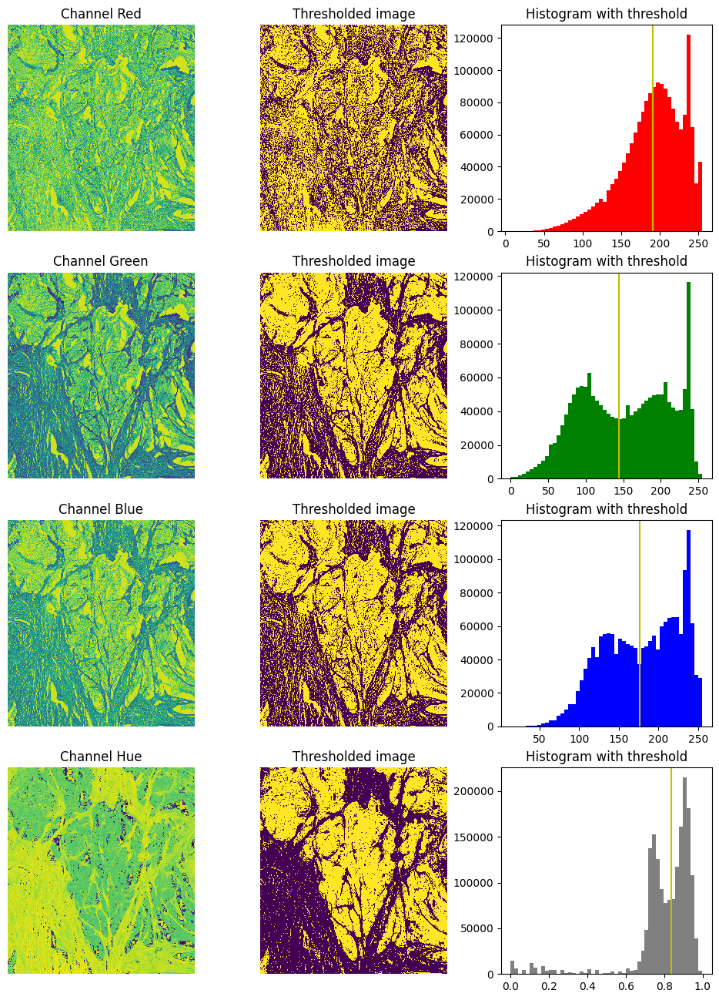

In [61]:
# Plot image, thresholded image and histogram for each channel with the method that gives the lowest error
fig, ax = plt.subplots(4, 3, figsize=(12, 16))

## Do the plotting for the RGB channels ##
for i in range(3):
    # Original image
    ax[i, 0].imshow(adeno_img[:, :, i], interpolation='nearest')
    ax[i, 0].set_title(f'Channel {channel_name[i]}')
    ax[i, 0].axis('off')

    # Thresholded image
    threshold = thresholds[i, int(best_thresholding_method_index[i])]
    prediction = adeno_img[:, :, i] > threshold
    ax[i, 1].imshow(adeno_img[:, :, i], interpolation='nearest')
    ax[i, 1].imshow(prediction, interpolation='nearest')
    ax[i, 1].set_title('Thresholded image')
    ax[i, 1].axis('off')
    
    # Histogram with threshold
    ax[i, 2].hist(adeno_img[:, :, i].flatten(), bins=50, color=channel_name[i].lower())
    ax[i, 2].axvline(threshold, color='y')
    ax[i, 2].set_title('Histogram with threshold')

## Do the plotting for the Hue channel ##
# Original image
ax[3, 0].imshow(hsv_image[:, :, 0], interpolation='nearest')
ax[3, 0].set_title(f'Channel {channel_name[3]}')
ax[3, 0].axis('off')

# Thresholded image
threshold = thresholds[3, int(best_thresholding_method_index[3])]
prediction = hsv_image[:, :, 0] < threshold
ax[3, 1].imshow(hsv_image[:, :, 0], interpolation='nearest')
ax[3, 1].imshow(prediction, interpolation='nearest')
ax[3, 1].set_title('Thresholded image')
ax[3, 1].axis('off')

# Histogram with threshold
ax[3, 2].hist(hsv_image[:, :, 0].flatten(), bins=50, color='grey')
ax[3, 2].axvline(threshold, color='y')
ax[3, 2].set_title('Histogram with threshold')

# Show the plots
plt.suptitle('')
plt.show()

#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

##### Best threshold
From the result obtained in the previous section we can say that we obtain the minimum error if we apply the Triangle method to the Hue channel.
Results:
- Threshold at 0.84 (the Hue values are from 0 to 1)
- Error obtained by applying the Triangle method to the Hue channel 0.189
##### Final mask creation

In [62]:
mask_thesholding = hsv_image[:, :, 0] < thresholds[3, int(best_thresholding_method_index[3])]
mask_thesholding = mask_thesholding.astype(np.uint8)

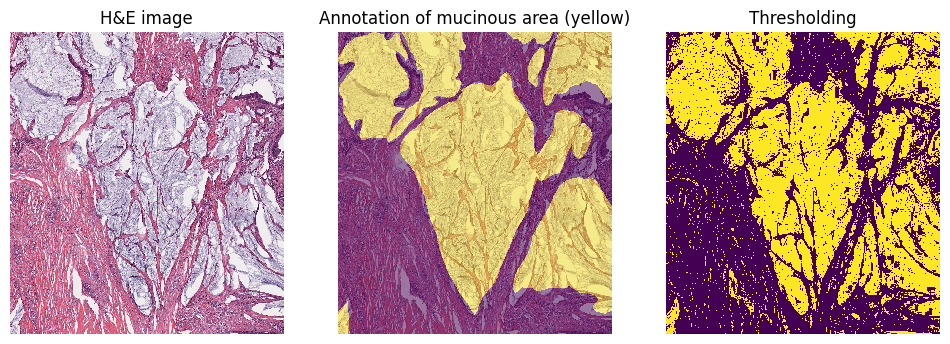

In [63]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

##### Apply closing and then opening

In [64]:
# Closing, opening and disk on the mask_thresholding
from skimage.morphology import disk, binary_closing, binary_opening
sizes = [0, 1, 2, 5, 10]
masks = []
errors = []

tableHeader = ['', 'Opening 0', 'Opening 1', 'Opening 2', 'Opening 5', 'Opening 10']
tableElem = []

for closing_size in sizes:
    temp = [f'Closing {closing_size}']
    for opening_size in sizes:
        mask = binary_closing(mask_thesholding, disk(closing_size))
        mask = binary_opening(mask, disk(opening_size))
        error = error_rate(mask, adeno_gt)
        errors.append(error)
        masks.append(mask)
        temp.append(np.around(error, 4))
    tableElem.append(temp)


# Display MRI image
fig, ax = plt.subplots(len(sizes), len(sizes), figsize=(12, 12))
for i in range(len(sizes)):
    for j in range(len(sizes)):
        ax[i, j].imshow(masks[i * len(sizes) + j], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title(f'Clos. {sizes[i]}, Open. {sizes[j]}')
        ax[i, j].axis('off')
plt.show()

print("Errors for each combination of closing and opening:")
print(tabulate(tableElem, tableHeader, tablefmt="pretty"))


KeyboardInterrupt: 

##### Apply opening and then closing

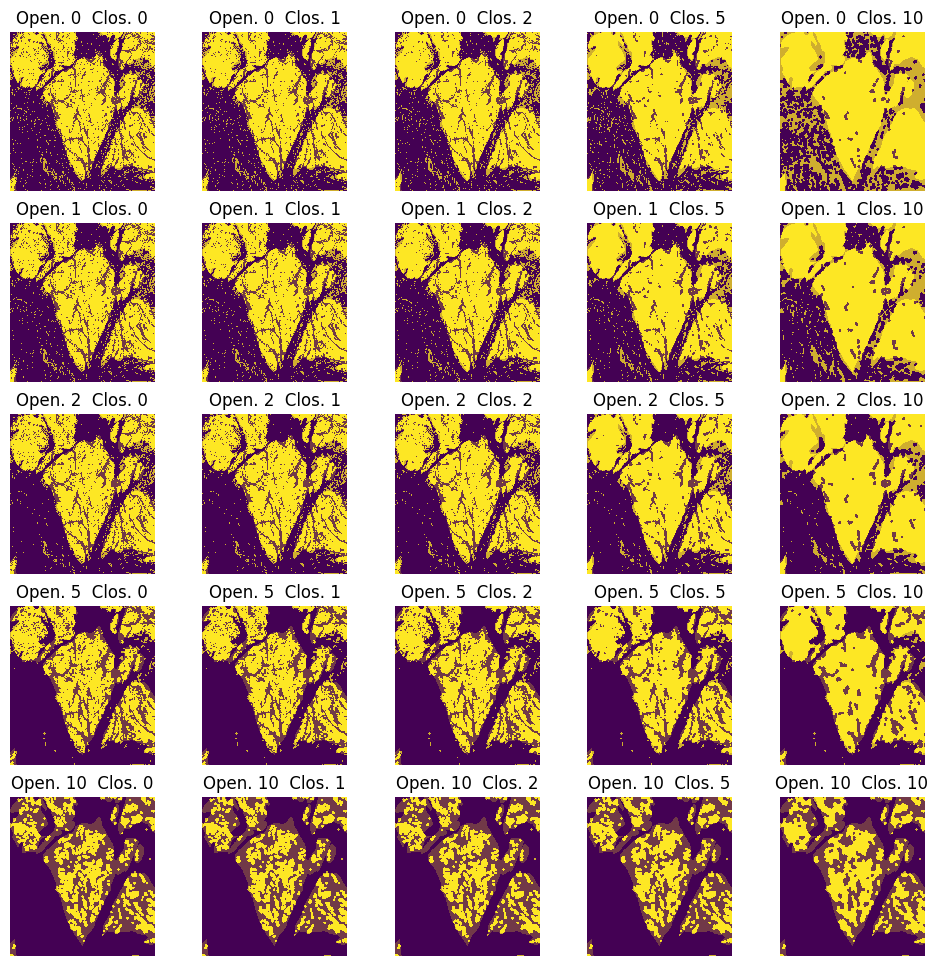

Errors for each combination of closing and opening:
+------------+-----------+-----------+-----------+-----------+------------+
|            | Closing 0 | Closing 1 | Closing 2 | Closing 5 | Closing 10 |
+------------+-----------+-----------+-----------+-----------+------------+
| Opening 0  |   0.189   |  0.1799   |  0.1725   |  0.1665   |   0.2424   |
| Opening 1  |  0.1852   |  0.1775   |  0.1688   |  0.1514   |   0.1587   |
| Opening 2  |  0.1811   |  0.1747   |  0.1661   |  0.1424   |    0.13    |
| Opening 5  |  0.2029   |  0.1994   |  0.1935   |  0.1735   |   0.138    |
| Opening 10 |  0.3047   |  0.3038   |  0.3019   |  0.2937   |   0.2732   |
+------------+-----------+-----------+-----------+-----------+------------+


In [ ]:
# Closing, opening and disk on the mask_thresholding
from skimage.morphology import disk, binary_closing, binary_opening
sizes = [0, 1, 2, 5, 10]
masks = []
errors = []

tableHeader = ['', 'Closing 0', 'Closing 1', 'Closing 2', 'Closing 5', 'Closing 10']
tableElem = []

for opening_size in sizes:
    temp = [f'Opening {opening_size}']
    for closing_size in sizes:
        mask = binary_opening(mask_thesholding, disk(opening_size))
        mask = binary_closing(mask, disk(closing_size))
        error = error_rate(mask, adeno_gt)
        errors.append(error)
        masks.append(mask)
        temp.append(np.around(error, 4))
    tableElem.append(temp)


# Display MRI image
fig, ax = plt.subplots(len(sizes), len(sizes), figsize=(12, 12))
for i in range(len(sizes)):
    for j in range(len(sizes)):
        ax[i, j].imshow(masks[i * len(sizes) + j], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title(f'Open. {sizes[i]}  Clos. {sizes[j]}')
        ax[i, j].axis('off')
plt.show()

print("Errors for each combination of closing and opening:")
print(tabulate(tableElem, tableHeader, tablefmt="pretty"))


##### Comments

##### Remove small holes and then remove small objects

C:\Users\aless\AppData\Local\Temp\ipykernel_3308\653803741.py:13: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  mask = remove_small_holes(mask_thesholding, hole_size)


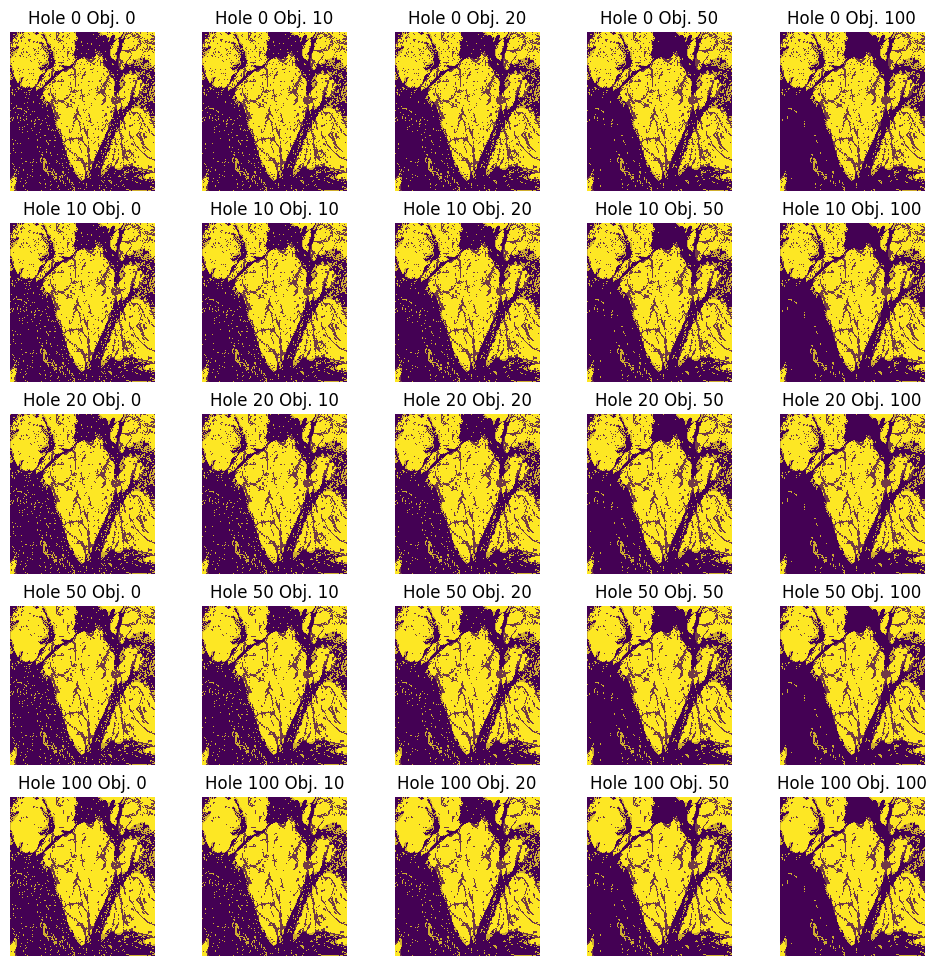

Errors for each combination of remove small holes and remove small objects:
+-------------------+---------------+----------------+----------------+----------------+-----------------+
|                   | Small holes 0 | Small holes 10 | Small holes 20 | Small holes 50 | Small holes 100 |
+-------------------+---------------+----------------+----------------+----------------+-----------------+
|  Small objects 0  |     0.189     |     0.186      |     0.1832     |     0.178      |     0.1737      |
| Small objects 10  |    0.1845     |     0.1815     |     0.1786     |     0.1736     |     0.1691      |
| Small objects 20  |     0.181     |     0.178      |     0.1751     |      0.17      |     0.1656      |
| Small objects 50  |    0.1744     |     0.1714     |     0.1685     |     0.1634     |      0.159      |
| Small objects 100 |     0.17      |     0.1669     |     0.164      |     0.1589     |     0.1545      |
+-------------------+---------------+----------------+--------------

In [ ]:
# remove_small_holes, remove_small_objects on the mask_thresholding
from skimage.morphology import remove_small_holes, remove_small_objects
sizes = [0, 10, 20, 50, 100]
masks = []
errors = []

tableHeader = ['', 'Small holes 0', 'Small holes 10', 'Small holes 20', 'Small holes 50', 'Small holes 100']
tableElem = []

for hole_size in sizes:
    temp = [f'Small objects {hole_size}']
    for object_size in sizes:
        mask = remove_small_holes(mask_thesholding, hole_size)
        mask = remove_small_objects(mask, object_size)
        error = error_rate(mask, adeno_gt)
        errors.append(error)
        masks.append(mask)
        temp.append(np.around(error, 4))
    tableElem.append(temp)

# Display MRI image
fig, ax = plt.subplots(len(sizes), len(sizes), figsize=(12, 12))
for i in range(len(sizes)):
    for j in range(len(sizes)):
        ax[i, j].imshow(masks[i * len(sizes) + j], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title(f'Hole {sizes[i]} Obj. {sizes[j]}')
        ax[i, j].axis('off')
plt.show()

print("Errors for each combination of remove small holes and remove small objects:")
print(tabulate(tableElem, tableHeader, tablefmt="pretty"))

##### Remove small objects and then small holes

C:\Users\aless\AppData\Local\Temp\ipykernel_18812\653803741.py:13: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  mask = remove_small_holes(mask_thesholding, hole_size)


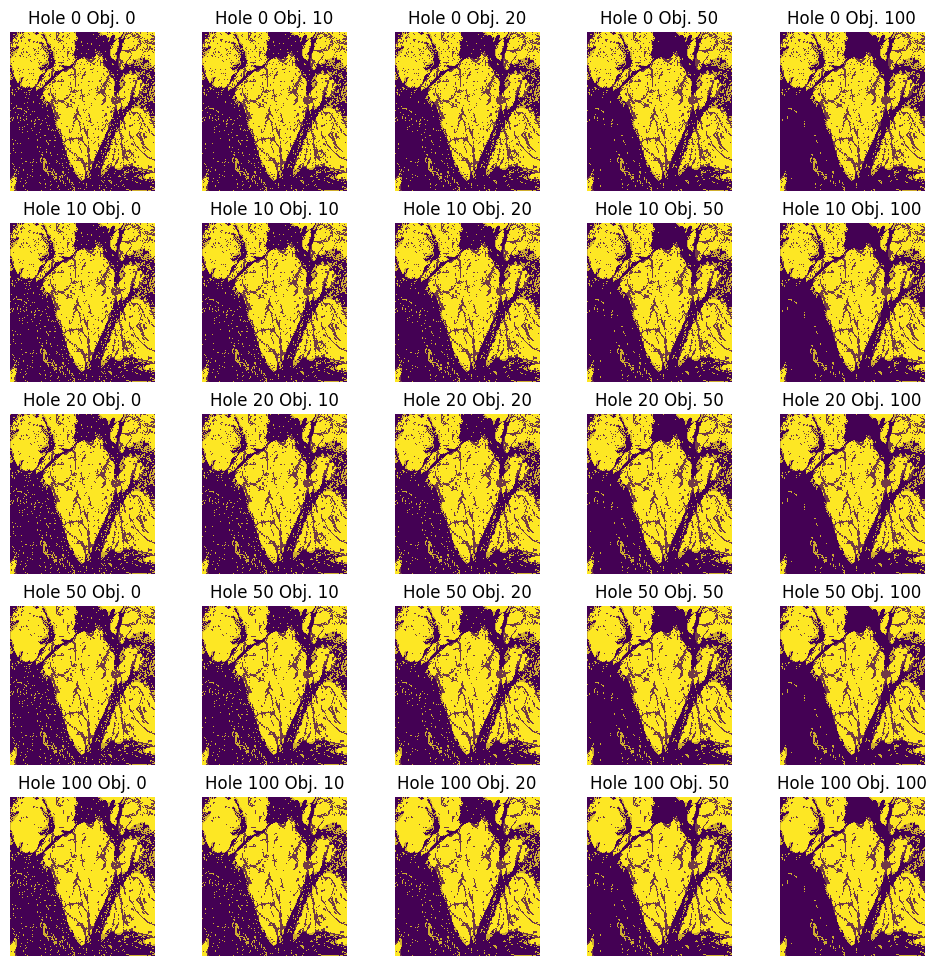

Errors for each combination of remove small holes and remove small objects:
+-------------------+---------------+----------------+----------------+----------------+-----------------+
|                   | Small holes 0 | Small holes 10 | Small holes 20 | Small holes 50 | Small holes 100 |
+-------------------+---------------+----------------+----------------+----------------+-----------------+
|  Small objects 0  |     0.189     |     0.186      |     0.1832     |     0.178      |     0.1737      |
| Small objects 10  |    0.1845     |     0.1815     |     0.1786     |     0.1736     |     0.1691      |
| Small objects 20  |     0.181     |     0.178      |     0.1751     |      0.17      |     0.1656      |
| Small objects 50  |    0.1744     |     0.1714     |     0.1685     |     0.1634     |      0.159      |
| Small objects 100 |     0.17      |     0.1669     |     0.164      |     0.1589     |     0.1545      |
+-------------------+---------------+----------------+--------------

In [ ]:
# remove_small_holes, remove_small_objects on the mask_thresholding
from skimage.morphology import remove_small_holes, remove_small_objects
sizes = [0, 10, 20, 50, 100]
masks = []
errors = []

tableHeader = ['', 'Small holes 0', 'Small holes 10', 'Small holes 20', 'Small holes 50', 'Small holes 100']
tableElem = []

for hole_size in sizes:
    temp = [f'Small objects {hole_size}']
    for object_size in sizes:
        mask = remove_small_holes(mask_thesholding, hole_size)
        mask = remove_small_objects(mask, object_size)
        error = error_rate(mask, adeno_gt)
        errors.append(error)
        masks.append(mask)
        temp.append(np.around(error, 4))
    tableElem.append(temp)

# Display MRI image
fig, ax = plt.subplots(len(sizes), len(sizes), figsize=(12, 12))
for i in range(len(sizes)):
    for j in range(len(sizes)):
        ax[i, j].imshow(masks[i * len(sizes) + j], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title(f'Hole {sizes[i]} Obj. {sizes[j]}')
        ax[i, j].axis('off')
plt.show()

print("Errors for each combination of remove small holes and remove small objects:")
print(tabulate(tableElem, tableHeader, tablefmt="pretty"))

##### Comments

##### Test various combinations of morphology operations

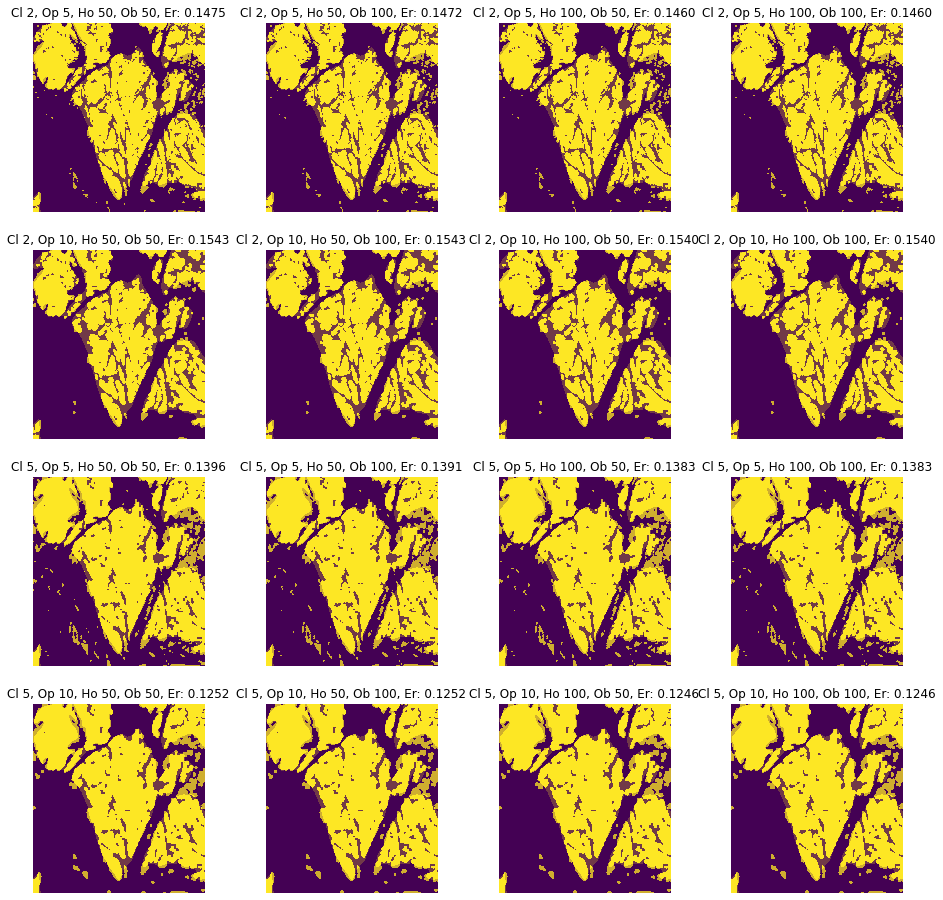

In [ ]:
# Apply remove_small_holes, remove_small_objects on the mask closed and opened
closing_sizes = [2, 5]
opening_sizes = [5, 10]
hole_sizes = [50, 100]
object_sizes = [50, 100]
masks = []
errors = []
for closing_size in closing_sizes:
    for opening_size in opening_sizes:
        mask = binary_closing(mask_thesholding, disk(closing_size))
        mask = binary_opening(mask, disk(opening_size))
        for hole_size in hole_sizes:
            for object_size in object_sizes:
                mask = remove_small_holes(mask, hole_size)
                mask = remove_small_objects(mask, object_size)
                error = error_rate(mask, adeno_gt)
                errors.append(error)
                masks.append(mask)
# Display MRI image
fig, ax = plt.subplots(4, 4, figsize=(16, 16))
for i in range(4):
    for j in range(4):
        ax[i, j].imshow(masks[i * 4 + j], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title('Cl {}, Op {}, Ho {}, Ob {}, Er: {:.4f}'.format(closing_sizes[i//2], opening_sizes[i%2], hole_sizes[j//2], object_sizes[j%2], errors[i * 4 + j]))
        ax[i, j].axis('off')
plt.show()

The best result is obtained for the following combination:
- Closing: 5
- Opening: 10
- Holes: 100
- Object: 50 or 100

In [ ]:
mask_morph = masks[np.argmin(errors)]

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

Since the region results of the region growing algorithm depends on the selection of the seed points (which is a randomic choice) we apply the region growing algorithm multiple times with multiple tolerance thresholds (the tolerance thresholds are the same between the different experiments). <br>
We will then plot then plot the mean values with the variance and we will choose the best method based on the mean values of the errors (the mean value it's an estimation of the true value for the central limit theorem)

In [ ]:
from skimage.segmentation import flood

# Get the hue channel from the hsv image
hue_image = hsv_image[:, :, 0]

# Get random seeds (we select 100 random seeds). We use the ground truth image to select the possible seeds points.
seeds = np.array(np.where(adeno_gt == 0)).T 
tolerance_thresholds = [x/100 for x in range(1, 10)]
errors = [] 
masks = []

# Compute region growing
for i in range(2):
    random_seeds = seeds[np.random.choice(seeds.shape[0], 100, replace=False), :] # Generate 100 random seeds
    errors.append([])
    masks.append([])
    for tolerance in tolerance_thresholds:
        mask = np.ones_like(hue_image)
        for seed in random_seeds:
            new_mask = flood(hue_image, (seed[0], seed[1]), tolerance=tolerance)
            mask = np.logical_and(mask, np.logical_not(new_mask).astype(int))
        errors[i].append(np.min(error_rate(mask, adeno_gt)))
        masks[i].append(mask)
        
# Invert the columns and the rows of the errors matrix
errors = np.array(errors).T
masks = np.array(masks)

[[0.43630379966127986, 0.44485786073102124], [0.20910595775054291, 0.21067975199522573], [0.18550973103192642, 0.16322743689214447], [0.18513568772502362, 0.20214875224215056], [0.2095413104115095, 0.2174614665084998], [0.2569700017267864, 0.2864851122326786], [0.416246641344216, 0.40179732027500337], [0.4687358854898758, 0.44733385868137643], [0.48259798669080795, 0.47162923702477516]]


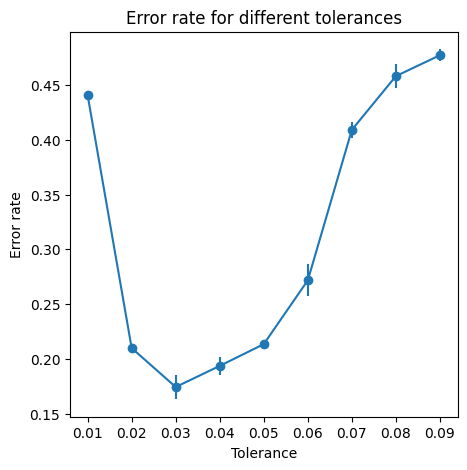

TypeError: Invalid shape (1269,) for image data

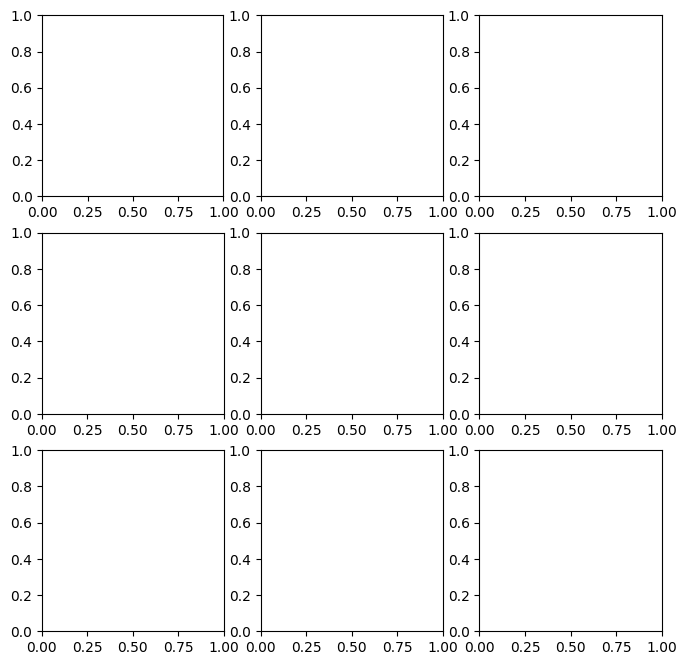

In [ ]:
print(errors)
# Plot the mean with the standard deviation
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.errorbar(tolerance_thresholds, [np.mean(x) for x in errors], yerr=[np.std(x) for x in errors], fmt='-o')
ax.set_xlabel('Tolerance')
ax.set_ylabel('Error rate')
ax.set_title('Error rate for different tolerances')
plt.show()


# Display for each threshold the best mask
fig, ax = plt.subplots(3, 3, figsize=(8, 8))
for i in range(3):
    for j in range(3):
        ax[i, j].imshow(masks[3*i + j][np.argmin(errors[3*i + j])], interpolation='nearest')
        ax[i, j].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
        ax[i, j].set_title('Tol: {}, Er: {:.4f}'.format(tolerance_thresholds[j], np.argmin(errors[3*i + j])))
        ax[i, j].axis('off')
plt.show()

mask_region = masks[np.argmin(errors)][np.argmin(errors[0])]

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

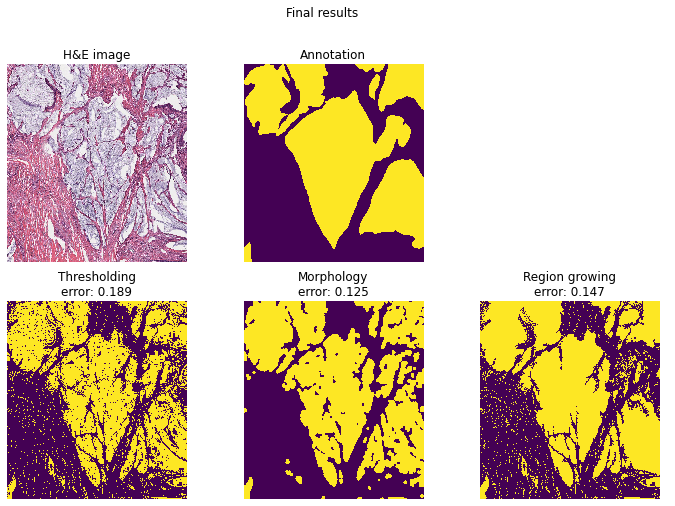

In [ ]:
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))


# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))


[a.axis('off') for a in ax.ravel()]


plt.suptitle("Final results")
plt.show()

## Comments
The lowest error is achieved with morphology applied on Thresholding. The region growing mask achieves better results than the thresholding one, therefore we could try applying morphology techniques on region growing.

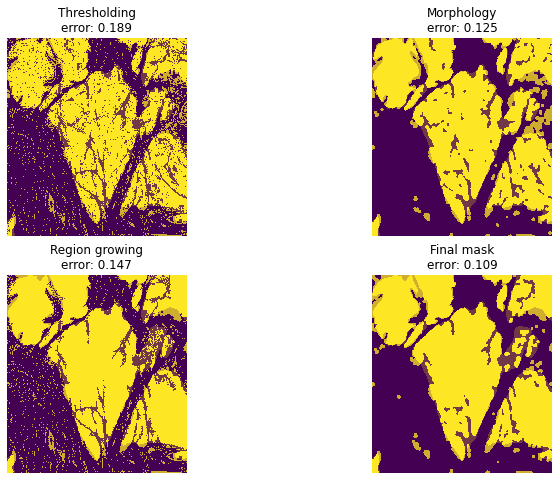

In [ ]:
mask = binary_closing(mask_region, disk(5))
mask = binary_opening(mask, disk(10))
mask = remove_small_holes(mask, 100)
mask = remove_small_objects(mask, 50)
error = error_rate(mask, adeno_gt)
# Display MRI image of mask thresholding, morphology, region growing and final mask
fig, ax = plt.subplots(2, 2, figsize=(12, 8))
ax[0, 0].imshow(mask_thesholding, interpolation='nearest')
ax[0, 0].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
ax[0, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))
ax[0, 0].axis('off')
ax[0, 1].imshow(mask_morph, interpolation='nearest')
ax[0, 1].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
ax[0, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))
ax[0, 1].axis('off')
ax[1, 0].imshow(mask_region, interpolation='nearest')
ax[1, 0].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
ax[1, 0].set_title('Region growing\nerror: {:.3f}'.format(error_region))
ax[1, 0].axis('off')
ax[1, 1].imshow(mask, interpolation='nearest')
ax[1, 1].imshow(adeno_gt, alpha=0.25, interpolation='nearest')
ax[1, 1].set_title('Final mask\nerror: {:.3f}'.format(error))
ax[1, 1].axis('off')
plt.show()


## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. <br><br>
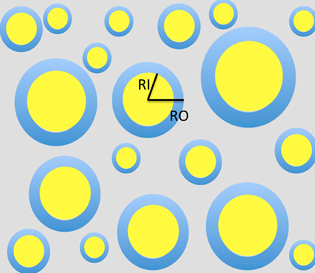

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 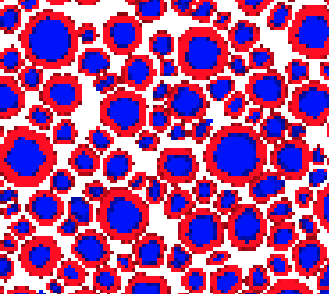

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

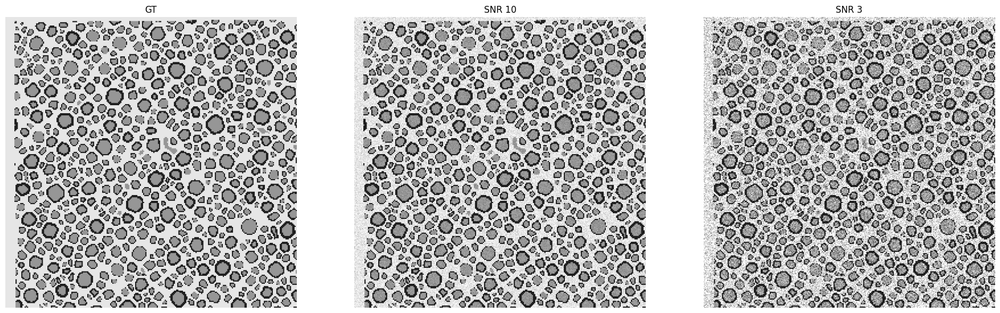

In [65]:
import cv2
import matplotlib.pyplot as plt

data_base_path = ''
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv2.imread(path_folder+ files[0])
snr_10 = cv2.imread(path_folder+ files[1])
snr_3 = cv2.imread(path_folder+ files[2])

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing 

Denoising with total variation


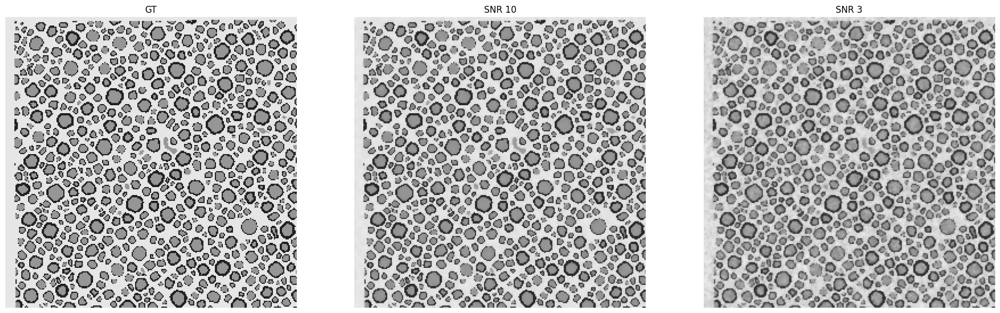

In [ ]:
# Denoise with total variation
from skimage.restoration import denoise_tv_chambolle

# Denoise with total variation
print("Denoising with total variation")
snr_10 = denoise_tv_chambolle(snr_10, weight=0.1, channel_axis=-1)
snr_3 = denoise_tv_chambolle(snr_3, weight=0.2, channel_axis=-1)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), [gt_0, snr_10, snr_3], im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

#### Best results obtained with total variation filter


### 2.1.2 Results Segmetations

In [ ]:
from skimage.filters import threshold_multiotsu

def segmentImage(img, n_classes):
    # Segment images into three classes with multi otsu
    thresholds = threshold_multiotsu(img[:, :, 0], classes=n_classes)
    regions = np.digitize(img, bins=thresholds)
    length = len(regions)
    color_map = {0: np.array([255, 0, 0]), 1: np.array([0, 0, 255]), 2: np.array([255, 255, 255])}
    for i in range(length):
        for j in range(length):
            regions[i,j] = color_map[regions[i,j,0]]
    return regions

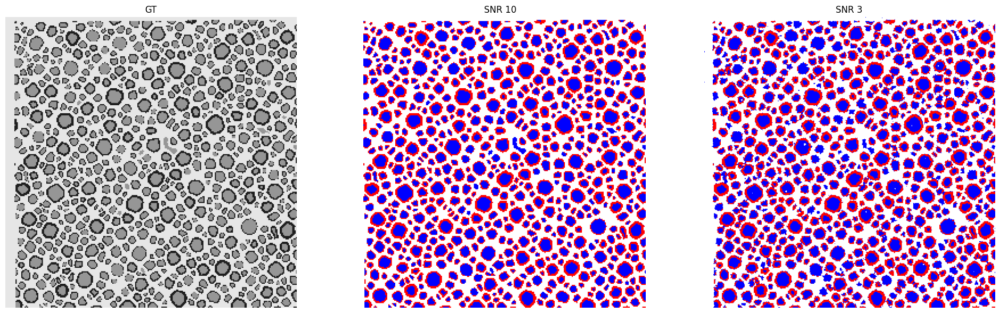

In [ ]:
snr_3 = segmentImage(snr_3, 3)
snr_10 = segmentImage(snr_10, 3)
images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.3 Radii histrograms 

In [ ]:
# TO DO: Implement the function to compute the radiis of the nuclei

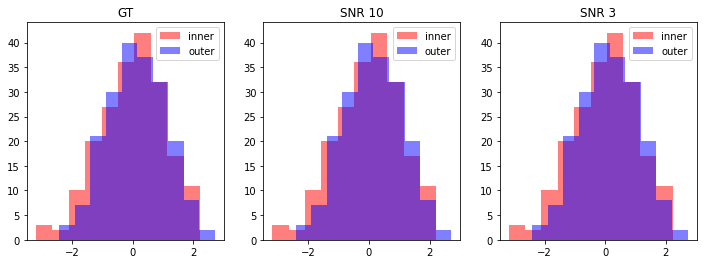

In [121]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ rads_inner ,rads_outer]
rads_test0 = [ rads_inner ,rads_outer]  # your result
rads_test1 = [ rads_inner ,rads_outer]  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


### 2.2 Low frequencies

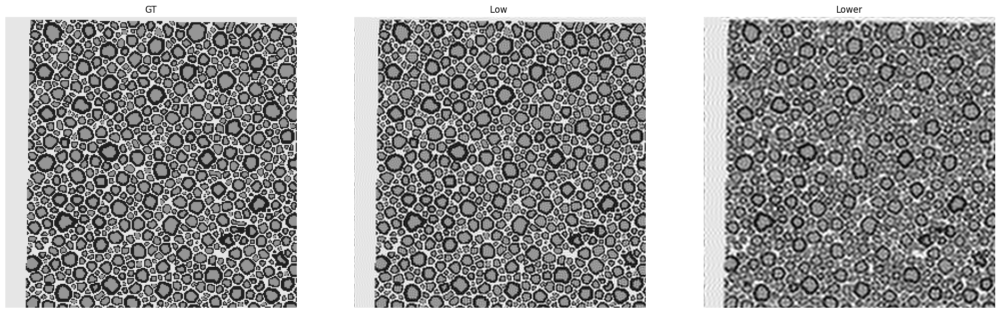

In [66]:

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder+ files[0])
lowfreq0 = cv2.imread(path_folder+ files[1])
lowfreq1 = cv2.imread(path_folder+ files[2])

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

In [102]:
# Derivative filter
def applyDerivative(img):
    derivative = np.array([[1, 0, -1]])
    img = cv2.filter2D(img, -1, derivative)
    return img

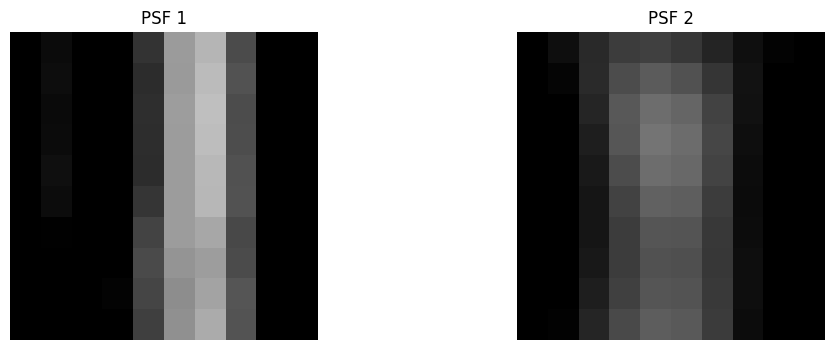

In [115]:
stepResponseImages = [images[1][55:65,36:46], images[2][55:65,36:46]]
psf1 = applyDerivative(stepResponseImages[0])
psf2 = applyDerivative(stepResponseImages[1])

# Plot psf1 and psf2
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, im, nm in zip(axes.ravel(), [psf1, psf2], ["PSF 1", "PSF 2"]):
    ax.imshow(im)
    ax.axis('off')
    ax.set_title(nm)
plt.show()


In [122]:
print(images[1][0:512,0:512][0])

[[219 219 219]
 [226 226 226]
 [234 234 234]
 ...
 [194 194 194]
 [216 216 216]
 [227 227 227]]


In [135]:
from skimage.restoration import unsupervised_wiener

img1 = images[1][:,:,:]
img2 = images[2][:,:,:]

print(img1)

preImage1 = unsupervised_wiener(img1, psf1)
preImage2 = unsupervised_wiener(img2, psf2)

# Plot preImage1 and preImage2
fig, axes = plt.subplots(1, 2, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), [preImage1, preImage2], ["PreImage1", "PreImage2"]):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

[[219 226 234 ... 207 217 217]
 [231 231 229 ... 229 226 229]
 [234 231 228 ... 234 232 234]
 ...
 [189 215 243 ... 122 165 180]
 [192 214 242 ... 132 177 189]
 [203 219 239 ... 168 199 203]]


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

### 2.2.2 Results Segmetations

### 2.2.3 Radii histrograms

In [1]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ rads_inner ,rads_outer]
rads_test0 = [ rads_inner ,rads_outer]  # your result
rads_test1 = [ rads_inner ,rads_outer]  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


NameError: name 'gt_0' is not defined

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

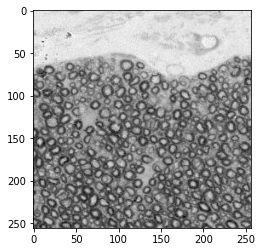

In [26]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])